# **Google Analytics 360**
# New Customer Acquisition Lifetime Value Prediction
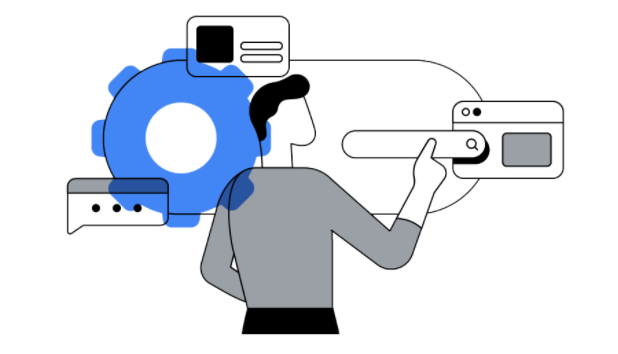

This notebook provides an example of training a customer "lifetime" value model for newly acquired e-commerce customers. It is meant to outline the minimum steps required to train this type of model and can be used as a starting point for your project. It is **not** meant to illustrate best practices or preferred approaches for this type of modeling.

The notebook references publicly available sample of Analytics 360 data, which is accessible through Google Cloud Platform's BigQuery data warehouse. The data was collected from the Google Merchandise Store, which sells Google promotional products like t-shirts, pens, phone accessories, mugs, etc.

For each newly acquired customer, we would like to make an estimate of the *future* revenue we can expect from this customer. We will make a prediction one week after the customer is acquired to estimate their revenue up to 90 days after their acquisition date. By combining this predicted revenue with the actual revenue generated from the customer's first purchase and any subsequent purchase during their first week, we can get a more hollistic view of the value of the acquisition. By providing this value (first transaction revenue + subsequent week 1 revenue + day 8-90 predicted revenue) to Google advertising platforms, Google can automatically optimize digital ads to help acquire higher value new customers.

## Creating training, testing & holdout datasets

In [ ]:
# Authenticate using Google OAuth 2.0
# This will provide the credentials necessary to use Google APIs within this notebook (e.g. BigQuery API)
from google.colab import auth
auth.authenticate_user()
print('Authenticated')

Authenticated


Using SQL to select all data we need

In [ ]:
# Query the Analytics 360 sample in BigQuery and store results as a Pandas dataframe
import pandas as pd
import numpy as np
import google.auth
from google.cloud import bigquery
from google.cloud import bigquery_storage

# Change the project to the ID of your personal GCP project
# You can find this ID by going to BQ, clicking on your project name at the top of the UI and finding the ID listed for your project name in the pop-up
project = 'project-502-2'

credentials, project_id = google.auth.default(
    scopes=["https://www.googleapis.com/auth/cloud-platform"]
)

bqclient = bigquery.Client(credentials=credentials, project=project,)
bqstorageclient = bigquery_storage.BigQueryReadClient(credentials=credentials)

# The query below finds the first transaction of each customer before 05/01/2017
# It summarizes some information from the session where that transaction occurred (e.g. revenue, time on site, page views, etc.)
# It then summarizes some information from subsequent sessions that happen within 7 days of the first transaction session (e.g. additional visits, additional transactions)
# It then sums any subsequent revenue received from that customer over the next 8-90 days, which will be the target for our model
# We added several variables and extracted them out of the original dataset fot further analysis.
sql = """
WITH first_purchases AS (
# Find the start time for the session when the customer made their first purchase
SELECT 
    fullVisitorId, # Consider this the customer ID
    MIN(PARSE_TIMESTAMP('%s', CAST(visitStartTime AS string))) firstPurchaseSessionTime, # This will show "UTC" as the timezone but I think it's actually Pacific
    MIN(EXTRACT(DAYOFWEEK FROM PARSE_TIMESTAMP('%s', CAST(visitStartTime AS string)))) AS DAYOFWEEK,

FROM 
    `bigquery-public-data.google_analytics_sample.ga_sessions_*`
WHERE
    _TABLE_SUFFIX < '20170501' # The sample data ends in 08/2017 so we want to only look at acquisitions before 05/2017 to ensure they all have at least 90 days of subsequent data available
    AND totals.transactions > 0
    AND totals.transactionRevenue > 0
    AND geoNetwork.country = 'United States' # Only looking at US acquisitions so we can assume everything is in USD
GROUP BY
    fullVisitorId
),

first_purchases_sessions AS (
# Get session-level data from the session when the customer made their first purchase
# You'll see later that we have to query session-level data and hit-level data separately
SELECT 
    fp.fullVisitorId,
    ROUND(SUM(totals.transactionRevenue/1000000),2) AS revenue, # I've aggregated all the metrics here but really I don't have to since these are "totals" fields (i.e. session-level) and there will only be one session per customer
    MAX(visitNumber) AS visitNumber,
    SUM(totals.hits) AS hits,
    SUM(totals.pageviews) AS pageviews,
    MAX(EXTRACT(QUARTER FROM PARSE_TIMESTAMP('%s', CAST(visitStartTime AS string)))) AS quarter,
    COALESCE(SUM(totals.timeOnSite),0) AS timeOnSite,
    MAX(CASE WHEN DAYOFWEEK in(1,7) THEN 1 ELSE 0 END) AS WEEKEND,
    
    MAX(CASE WHEN channelGrouping = 'Referral' THEN 1 ELSE 0 END) AS referralChannelGrouping,
    MAX(CASE WHEN channelGrouping = 'Organic Search' THEN 1 ELSE 0 END) AS organicSearchChannelGrouping,
    MAX(CASE WHEN channelGrouping = 'Direct' THEN 1 ELSE 0 END) AS directChannelGrouping,
    MAX(CASE WHEN channelGrouping = 'Paid Search' THEN 1 ELSE 0 END) AS paidSearchChannelGrouping,
    MAX(CASE WHEN device.browser = 'Chrome' THEN 1 ELSE 0 END) AS chromeBrowser,
    MAX(CASE WHEN device.browser = 'Safari' THEN 1 ELSE 0 END) AS safariBrowser,
    MAX(CASE WHEN device.operatingSystem = 'Macintosh' THEN 1 ELSE 0 END) AS macintoshOS,
    MAX(CASE WHEN device.operatingSystem = 'Windows' THEN 1 ELSE 0 END) AS windowsOS,
    MAX(CASE WHEN device.operatingSystem = 'Chrome OS' THEN 1 ELSE 0 END) AS chromeOS,
    MAX(CASE WHEN device.operatingSystem = 'Linux' THEN 1 ELSE 0 END) AS LinuxOS,
    MAX(CASE WHEN device.isMobile IS TRUE THEN 1 ELSE 0 END) AS isMobile, # dummy variable indicating if the customer was on a mobile device
    MAX(CASE WHEN geoNetwork.region = 'California' THEN 1 ELSE 0 END) AS california, # dummy variable indicating if the customer was in California
    MAX(CASE WHEN geoNetwork.region = 'New York' THEN 1 ELSE 0 END) AS newYork, # dummy variable indicating if the customer was in California
    MAX(CASE WHEN geoNetwork.metro = 'San Francisco-Oakland-San Jose CA' THEN 1 ELSE 0 END) AS bayArea

FROM 
    `bigquery-public-data.google_analytics_sample.ga_sessions_*` ga
JOIN
    first_purchases fp
ON
    ga.fullVisitorId = fp.fullVisitorId
    AND PARSE_TIMESTAMP('%s', CAST(ga.visitStartTime AS string)) = fp.firstPurchaseSessionTime # Only getting data from first purchase
WHERE
    _TABLE_SUFFIX < '20170501' 
    AND totals.transactions > 0
    AND totals.transactionRevenue > 0
    AND geoNetwork.country = 'United States'
GROUP BY
    fp.fullVisitorId
),

first_purchases_hits AS (
# Get hit-level data from the session when the customer made their first purchase
# Hit data is stored in nested fields so we have to query it separately from the session-level data or else the session-level data aggregations would be incorrect
SELECT 
    fp.fullVisitorId,
    SUM(CASE WHEN hits.eCommerceAction.action_type = '6' THEN product.productQuantity ELSE 0 END) AS productQuantityPurchased, # Product quantity in the final transaction
    MAX(CASE WHEN product.v2ProductCategory = 'Apparel' AND hits.eCommerceAction.action_type = '6' THEN 1 ELSE 0 END) AS apparelPurchased, # dummy variable indicating if any apparel was purchased
    MAX(CASE WHEN product.v2ProductCategory = 'Office' AND hits.eCommerceAction.action_type = '6' THEN 1 ELSE 0 END) AS officePurchased,# dummy variable indicating if any office supplies were purchased
    MAX(CASE WHEN product.v2ProductCategory = 'Drinkware' AND hits.eCommerceAction.action_type = '6' THEN 1 ELSE 0 END) AS drinkwarePurchased,
    MAX(CASE WHEN product.v2ProductCategory = 'Lifestyle' AND hits.eCommerceAction.action_type = '6' THEN 1 ELSE 0 END) AS lifestylePurchased,
    MAX(CASE WHEN product.v2ProductCategory = 'Bags' AND hits.eCommerceAction.action_type = '6' THEN 1 ELSE 0 END) AS bagsPurchased,
    MAX(CASE WHEN product.v2ProductCategory = 'Electronics' AND hits.eCommerceAction.action_type = '6' THEN 1 ELSE 0 END) AS electronicsPurchased,# dummy variable indicating if any electronics were purchased
    
    MAX(CASE WHEN hits.eCommerceAction.action_type = '4' THEN 1 ELSE 0 END) AS removedItemFromCart # dummy variable indicating if they removed something from their cart during the session
FROM 
    `bigquery-public-data.google_analytics_sample.ga_sessions_*` ga,
    UNNEST(hits) hits,
    UNNEST(hits.product) product
JOIN
    first_purchases fp
ON
    ga.fullVisitorId = fp.fullVisitorId
    AND PARSE_TIMESTAMP('%s', CAST(ga.visitStartTime AS string)) = fp.firstPurchaseSessionTime # Only getting data from first purchase
WHERE
    _TABLE_SUFFIX < '20170501' 
    AND totals.transactions > 0
    AND totals.transactionRevenue > 0
    AND geoNetwork.country = 'United States'
GROUP BY
    fp.fullVisitorId
),

# Get session level data that occured after the first purchase session but within 7 days of that session
# Looking to see if the user came back within a week and had any additional activity
first_week_sessions AS (
SELECT 
    fp.fullVisitorId,
    COALESCE(SUM(ga.totals.visits),0) AS firstWeekVisits, # Visits from first week of acquisition, excluding acquisition session
    COALESCE(SUM(ga.totals.transactions),0) AS firstWeekTransactions, # Transactions from first week of acquisition, excluding acquisition session
    COALESCE(ROUND(SUM(ga.totals.transactionRevenue/1000000),2),0) AS firstWeekRevenue, # Revenue from first week of acquisition, excluding acquisition session
FROM 
    first_purchases fp
LEFT JOIN
    `bigquery-public-data.google_analytics_sample.ga_sessions_*` ga
ON 
    fp.fullVisitorId = ga.fullVisitorId
    AND TIMESTAMP_DIFF(PARSE_TIMESTAMP('%s', CAST(ga.visitStartTime AS string)), fp.firstPurchaseSessionTime, HOUR) BETWEEN 1 AND 168 # Consider visits between 1 hour and 7 days after first purchase session
GROUP BY 
    fp.fullVisitorId
),

future_purchases AS (
# For each newly acquired customer, look for any purchases that occurred in the next 8-90 days
SELECT
    fp.fullVisitorId,
    ROUND(SUM(ga.totals.transactionRevenue/1000000),2) AS futureRevenue # This is our model target
FROM 
    first_purchases fp
LEFT JOIN
    `bigquery-public-data.google_analytics_sample.ga_sessions_*` ga
ON 
    fp.fullVisitorId = ga.fullVisitorId
    AND TIMESTAMP_DIFF(PARSE_TIMESTAMP('%s', CAST(ga.visitStartTime AS string)), fp.firstPurchaseSessionTime, DAY) BETWEEN 8 AND 90 # Consider purchases between 8-90 days after acquisition
WHERE 
    ga.totals.transactions > 0
    AND totals.transactionRevenue > 0
GROUP BY 
    fp.fullVisitorId
)

# Join the list of newly acquired customers to their acquisition session-level data, acquisition hit-level data, first week session-level data, and future day 8-90 revenue
SELECT
    first_purchases.*,
    first_purchases_sessions.* EXCEPT(fullVisitorId),
    first_purchases_hits.* EXCEPT(fullVisitorId),
    first_week_sessions.* EXCEPT(fullVisitorId),
    COALESCE(future_purchases.futureRevenue,0) AS futureRevenue
FROM 
    first_purchases
LEFT JOIN 
    first_purchases_sessions 
USING(fullVisitorId)
LEFT JOIN 
    first_purchases_hits 
USING(fullVisitorId)
LEFT JOIN 
    future_purchases 
USING(fullVisitorId)
LEFT JOIN
    first_week_sessions 
USING(fullVisitorId)
order by fullVisitorId
"""

# Store query results as Panada dataframe
df = pd.read_gbq(sql, project_id=project, dialect='standard', use_bqstorage_api=True)

/usr/local/lib/python3.7/dist-packages/google/cloud/bigquery_storage_v1beta1/reader.py:603: FutureWarning: Using .astype to convert from timezone-aware dtype to timezone-naive dtype is deprecated and will raise in a future version.  Use obj.tz_localize(None) or obj.tz_convert('UTC').tz_localize(None) instead
  df[column] = pandas.Series(df[column], dtype=dtypes[column])


In [ ]:
df.head()

In [ ]:
# Create development and holdout datasets
# Dev data will be further split into training and testing data
# The holdout data will be used to get a final estimate of the model's performance
dev_data = df[df['firstPurchaseSessionTime'] < '2017-04-01 00:00:00 UTC']
holdout_data = df[df['firstPurchaseSessionTime'] >= '2017-04-01 00:00:00 UTC']

## Exploratory Data Analysis

In [ ]:
!pip install pycaret
#from pycaret.utils import enable_colab
#enable_colab()
from pycaret.regression import *

eda_data = dev_data.drop(['fullVisitorId', 'firstPurchaseSessionTime'], axis=1) # Exclude fullVisitorId and firstPurchaseSessionTime from EDA
eda_data = eda_data.reset_index(drop=True)

pc_eda = setup(data = eda_data, target = 'futureRevenue', session_id=123 , profile=True)

In [ ]:
# Drop records with outlier values and re-do EDA
eda_data_v2 = eda_data.drop(
                    eda_data[(eda_data['futureRevenue'] >= 10000.00) 
                    | (eda_data['revenue'] >= 10000.00)
                    | (eda_data['visitNumber'] >= 150) 
                    | (eda_data['productQuantityPurchased'] >= 1500)].index)

eda_data_v2 = eda_data_v2.reset_index(drop=True)

pc_eda_v2 = setup(data = eda_data_v2, target = 'futureRevenue', session_id=123 , profile=True)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Model training

In [ ]:
#install all packages we need
!pip install yellowbrick
import xgboost as xgb
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.tree import DecisionTreeRegressor, DecisionTreeClassifier
from sklearn.metrics import roc_auc_score, r2_score, precision_score, recall_score, confusion_matrix, classification_report, accuracy_score, f1_score
from sklearn.metrics import mean_squared_error as mse
from sklearn.model_selection import train_test_split
from yellowbrick.regressor import prediction_error
from yellowbrick.regressor import ResidualsPlot

### Initial model

In [ ]:
# Drop the same rows dropped during EDA
dev_data = dev_data.drop(
                    dev_data[(dev_data['futureRevenue'] >= 10000.00) 
                    | (dev_data['revenue'] >= 10000.00)
                    | (dev_data['visitNumber'] >= 150) 
                    | (dev_data['productQuantityPurchased'] >= 1500)].index)

dev_data = dev_data.reset_index(drop=True)

# Setup the data for SK Learn
X = dev_data.drop(['fullVisitorId', 'firstPurchaseSessionTime','futureRevenue'], axis=1) # Feature matrix in pd.DataFrame format...fullVisitorId, session time, and future revenue aren't being used as predictor variables
y = pd.Series(dev_data.futureRevenue) # Target vector in pd.Series format

# Making train and test sets for both X and y
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, 
                                                    random_state=123, shuffle=True)

# Instantiate XGBoost object with hyperparameters...No hyperparameter tuning is included in this example but would be beneficial
model = xgb.XGBRegressor(max_depth=3, n_estimators=20,
                           reg_alpha=10, reg_lambda=0,
                           objectvie='reg:squarederror', booster='gbtree',
                           random_state=123, learning_rate=0.10)

#model = LinearRegression()
#model = DecisionTreeRegressor(max_depth=3)

# Fit the data(train the model)
model.fit(X_train, y_train)

# Calculate RMSE and R^2 for training data
train_y_pred = model.predict(X_train) # Predictions for training data
train_y_true = y_train # True values for training data

Training_MSE = mse(train_y_true, train_y_pred)
Training_RMSE = np.sqrt(Training_MSE)

Training_R_squared = r2_score(train_y_true, train_y_pred)

# Calculate RMSE and R^2 for testing data
test_y_pred = model.predict(X_test) # Predictions for testing data
test_y_true = y_test # True values for testing data

Testing_MSE = mse(test_y_true, test_y_pred)
Testing_RMSE = np.sqrt(Testing_MSE)

Testing_R_squared = r2_score(test_y_true, test_y_pred)

# Print evaluation metrics
print("\nTraining RMSE: ", np.round(Training_RMSE, 2))
print("Training R-Squared: ", np.round(Training_R_squared, 2))

print("\nTesting RMSE: ", np.round(Testing_RMSE, 2))
print("Testing R-Squared: ", np.round(Testing_R_squared, 2))

# Visualize the Prediction Error Plot
print("\nPrediction Error Plot")
viz = prediction_error(model, X_train, y_train, X_test, y_test)
viz.show() # Sometimes visualization fails after using PyCaret EDA... Have to restart runtime and skip EDA

[00:44:58] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.

Training RMSE:  127.53
Training R-Squared:  0.44

Testing RMSE:  159.72
Testing R-Squared:  0.26

Prediction Error Plot


### Regression model (repeat purchasers only)

In [ ]:
# Drop the same rows dropped during EDA
# Also drop any rows where futureRevenue = 0
reg_data = dev_data.drop(
                    dev_data[(dev_data['futureRevenue'] >= 10000.00) 
                    | (dev_data['revenue'] >= 10000.00)
                    | (dev_data['visitNumber'] >= 100) 
                    | (dev_data['productQuantityPurchased'] >= 1000)
                    | (dev_data['futureRevenue'] == 0)].index)

reg_data = reg_data.reset_index(drop=True)

# Look at correlation between futureRevenue and other variables to select initial feature set
reg_data[reg_data.columns[1:]].corr()['futureRevenue'][:-1]

DAYOFWEEK                      -0.088646
revenue                         0.362663
visitNumber                     0.045339
hits                            0.187032
pageviews                       0.200819
quarter                         0.140223
timeOnSite                      0.168338
WEEKEND                        -0.102681
referralChannelGrouping        -0.196190
organicSearchChannelGrouping   -0.057873
directChannelGrouping           0.274020
paidSearchChannelGrouping       0.025719
chromeBrowser                  -0.037515
safariBrowser                   0.076230
macintoshOS                    -0.146410
windowsOS                       0.059102
chromeOS                        0.207824
LinuxOS                        -0.081161
isMobile                       -0.024147
california                     -0.131329
newYork                        -0.032514
bayArea                        -0.142818
productQuantityPurchased        0.541093
apparelPurchased               -0.124817
officePurchased 

### *Hyperparameter tuning*

**Decision Tree Regressor hyperparameter tuning**

In [ ]:
from sklearn import preprocessing

normX = reg_data[['revenue','pageviews','referralChannelGrouping','directChannelGrouping','electronicsPurchased','officePurchased','chromeOS','productQuantityPurchased','firstWeekRevenue','WEEKEND']]
y = pd.Series(reg_data.futureRevenue) # Target vector in pd.Series format
X = preprocessing.normalize(normX)

# Feature matrix will include variables with largest correlations to futureRevenue
#X = reg_data[['revenue','pageviews','referralChannelGrouping','directChannelGrouping','electronicsPurchased','officePurchased','chromeOS','productQuantityPurchased','firstWeekRevenue','WEEKEND']]
#y = pd.Series(reg_data.futureRevenue) # Target vector in pd.Series format
# Making train and test sets for both X and y
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, 
                                                    random_state=123, shuffle=True)
reg_model = DecisionTreeRegressor()
reg_model.fit(X_train, y_train)

parameters={"splitter":["best","random"],
            "max_depth" : [1,3,5,7,9,11,12],
           "min_samples_leaf":[1,2,3,4,5,6,7,8,9,10],
           "min_weight_fraction_leaf":[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9],
           "max_features":["auto","log2","sqrt",None],
           "max_leaf_nodes":[None,10,20,30,40,50,60,70,80,90] }
from sklearn.model_selection import GridSearchCV
tuning_model=GridSearchCV(reg_model,param_grid=parameters,scoring='neg_mean_squared_error',cv=3,verbose=3)
def timer(start_time=None):
    if not start_time:
        start_time=datetime.now()
        return start_time
    elif start_time:
        thour,temp_sec=divmod((datetime.now()-start_time).total_seconds(),3600)
        tmin,tsec=divmod(temp_sec,60)
        #print(thour,":",tmin,':',round(tsec,2))
#X=reg_data.iloc[:,:-1]
#y=reg_data.iloc[:,-1]
#%%capture
from datetime import datetime

start_time=timer(None)

tuning_model.fit(X,y)

timer(start_time)
# best hyperparameters 
tuning_model.best_params_

**XGboost Regressor hyperparameter tuning**

In [ ]:
#Importing Packages

import matplotlib.pyplot as plt

from xgboost import XGBRegressor
from xgboost import XGBRFRegressor
from sklearn.model_selection import GridSearchCV

from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
#from sklearn.preprocessing import Imputer

#normalization
normX = reg_data[['revenue','quarter','pageviews','referralChannelGrouping','directChannelGrouping','electronicsPurchased','officePurchased','chromeOS','productQuantityPurchased','firstWeekRevenue']]
y = pd.Series(reg_data.futureRevenue) # Target vector in pd.Series format
X = preprocessing.normalize(normX)
#Train
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, 
                                                    random_state=123, shuffle=True)

#XGBoost hyper-parameter tuning
def hyperParameterTuning(X_train, y_train):
    param_tuning = {
        'learning_rate': [0.01, 0.1],
        'max_depth': [3, 5, 7, 10],
        'min_child_weight': [1, 3, 5],
        'subsample': [0.6, 0.7, 0.8, 0.9],
        'colsample_bytree': [0.5, 0.7, 0.9],
        'n_estimators' : [100, 200, 500],
        'objective': ['reg:squarederror'],
        'reg_alpha': [50,100,200],
        'reg_lambda': [3,5,7,9,10]
    } 
    reg_model = xgb.XGBRegressor()
#reg_model.fit(X_train, y_train)
    gsearch = GridSearchCV(estimator = reg_model,
                           param_grid = param_tuning,                        
                           #scoring = 'neg_mean_absolute_error', #MAE
                           #scoring = 'neg_mean_squared_error',  #MSE
                           cv = 5,
                           n_jobs = -1,
                           verbose = 1)

    gsearch.fit(X_train,y_train)

    return gsearch.best_params_
hyperParameterTuning(X_train, y_train)


### Regression model

In [ ]:
# Setup the data for SK Learn
from sklearn import preprocessing
# Feature matrix will include variables with largest correlations to futureRevenue
#normX = reg_data[['revenue','pageviews','referralChannelGrouping','directChannelGrouping','electronicsPurchased','officePurchased','chromeOS','productQuantityPurchased','firstWeekRevenue']]
y = pd.Series(reg_data.futureRevenue) # Target vector in pd.Series format
#X = preprocessing.normalize(normX)


X = reg_data[['revenue','pageviews','referralChannelGrouping','directChannelGrouping','electronicsPurchased','officePurchased','chromeOS','productQuantityPurchased','firstWeekRevenue','WEEKEND',
              'hits','macintoshOS','bayArea']]

# Making train and test sets for both X and y
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, 
                                                    random_state=123, shuffle=True)

# Instantiate XGBoost object with hyperparameters...No hyperparameter tuning is included in this example but would be beneficial
tuned_reg_model = xgb.XGBRegressor(max_depth=1,n_estimators=1000, 
                                   subsample=0.8,learning_rate=0.09,
                                   min_child_weight=6,reg_alpha=100)
#other models tried:
#reg_model = xgb.XGBRegressor(max_depth=1, n_estimators=100,
                          # reg_alpha=100, reg_lambda=10,
                           # objectvie='reg:squarederror', booster='gbtree',
                            # random_state=123, learning_rate=0.10)
#tuned_reg_model = xgb.XGBRegressor(max_depth=1, n_estimators=1000,
 #                           objectvie='reg:squarederror', subsample=0.8, learning_rate=0.09,
  #                           colsample_bytree=0.5, min_child_weight=6, reg_alpha=100, reg_lambda=10)
#reg_model = LinearRegression()
#reg_model = DecisionTreeRegressor(max_depth= 3,max_features= 'sqrt',max_leaf_nodes= 33
                                     #  ,min_samples_leaf= 5)

# Fit the data(train the model)
tuned_reg_model.fit(X_train, y_train)

# Get RMSE and R^2 for training data
train_y_pred = tuned_reg_model.predict(X_train) # Predictions for training data
train_y_true = y_train # True values for training data

Training_MSE = mse(train_y_true, train_y_pred)
Training_RMSE = np.sqrt(Training_MSE)

Training_R_squared = r2_score(train_y_true, train_y_pred)

# Get RMSE and R^2 for testing data
test_y_pred = tuned_reg_model.predict(X_test) # Predictions for testing data
test_y_true = y_test # True values for testing data

Testing_MSE = mse(test_y_true, test_y_pred)
Testing_RMSE = np.sqrt(Testing_MSE)

Testing_R_squared = r2_score(test_y_true, test_y_pred)

# Print evaluation metrics
print("\nTraining RMSE: ", np.round(Training_RMSE, 2))
print("Training R-Squared: ", np.round(Training_R_squared, 2))

print("\nTesting RMSE: ", np.round(Testing_RMSE, 2))
print("Testing R-Squared: ", np.round(Testing_R_squared, 2))

# Visualize the Prediction Error Plot
print("\nPrediction Error Plot")
viz = prediction_error(tuned_reg_model, X_train, y_train, X_test, y_test)
viz.show()

[00:45:31] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.

Training RMSE:  315.02
Training R-Squared:  0.68

Testing RMSE:  451.9
Testing R-Squared:  0.44

Prediction Error Plot


### Classification model (likelihood to purchase again)

In [ ]:
# Drop the same rows dropped during EDA
# We will include both repeat purchasers and single purchasers here since we're trying to predict repeat purchase
cla_data = dev_data.drop(
                    dev_data[(dev_data['futureRevenue'] >= 10000.00) 
                    | (dev_data['revenue'] >= 10000.00)
                    | (dev_data['visitNumber'] >= 100) 
                    | (dev_data['productQuantityPurchased'] >= 1000)].index)

# Add column to represent a user that purchased again
# This will be our model's target
cla_data['repeatPurchaser'] = np.where(cla_data['futureRevenue'] > 0, 1, 0)

dev_data = dev_data.reset_index(drop=True)

# Look at correlation between repeatPurchaser and other variables to select initial feature set
# Correlation isn't the best metric to look at for a classification problem. 
# Feel free to use another technique to select your intial features.
cla_data[cla_data.columns[1:]].corr()['repeatPurchaser'][:-1]

DAYOFWEEK                      -0.168135
revenue                         0.120940
visitNumber                     0.088569
hits                            0.069451
pageviews                       0.063192
quarter                        -0.006796
timeOnSite                      0.053665
WEEKEND                        -0.007564
referralChannelGrouping         0.029061
organicSearchChannelGrouping   -0.058179
directChannelGrouping           0.050635
paidSearchChannelGrouping      -0.030333
chromeBrowser                   0.032709
safariBrowser                  -0.031003
macintoshOS                     0.051852
windowsOS                      -0.025082
chromeOS                        0.040661
LinuxOS                        -0.041832
isMobile                       -0.052903
california                     -0.022611
newYork                         0.044598
bayArea                        -0.022069
productQuantityPurchased        0.130218
apparelPurchased               -0.014008
officePurchased 

Hyperparameter tuning

In [ ]:
from sklearn.model_selection import GridSearchCV
# Feature matrix will include variables with largest correlations to repeatVisitor (excluding futureRevenue, which we can't use)
X = cla_data[['revenue','productQuantityPurchased', 'firstWeekRevenue']]
y = pd.Series(cla_data.repeatPurchaser) # Target vector in pd.Series format



# Making train and test sets for both X and y
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, 
                                                    random_state=123, shuffle=True)

# cla model hyperparameter tuning
cla_model = xgb.XGBClassifier()
cla_model.fit(X_train, y_train)
param_test1 = {
    "max_depth":range(3,10,2),
    "min_child_weight":range(1,6,2),
    'subsample':[0.5,0.7,0.9],
    'gamma':[i/10.0 for i in range(0,5)],
    'colsample_bytree':[i/10.0 for i in range(6,10)],
    'reg_alpha':[0, 0.001, 0.005, 0.01, 0.05]}
gsearch1 = GridSearchCV(estimator = xgb.XGBClassifier( learning_rate =0.1, n_estimators=140, max_depth=5,
 min_child_weight=1, gamma=0, subsample=0.8, colsample_bytree=0.8,
 objective= 'binary:logistic', nthread=4, scale_pos_weight=1, seed=27), 
 param_grid = param_test1, scoring='roc_auc',n_jobs=4, cv=5)
gsearch1.fit(X_train,y_train)

In [ ]:
gsearch1.best_params_

In [ ]:
gsearch1.best_score_

Cla Model

In [ ]:
# Setup the data for SK Learn
from sklearn import neighbors, naive_bayes, linear_model

# Feature matrix will include variables with largest correlations to repeatVisitor (excluding futureRevenue, which we can't use)
X = cla_data[['revenue','productQuantityPurchased', 'firstWeekRevenue','DAYOFWEEK']]
y = pd.Series(cla_data.repeatPurchaser) # Target vector in pd.Series format

#Tried normalization but did not help
#normX = cla_data[['revenue','productQuantityPurchased', 'firstWeekRevenue']]
#X = preprocessing.normalize(normX)


# Making train and test sets for both X and y
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, 
                                                    random_state=123, shuffle=True)

# Instantiate XGBoost object with hyperparameters...No hyperparameter tuning is included in this example but would be beneficial

cla_model = LogisticRegression(penalty='l1',class_weight='balanced', solver = "liblinear" ,C=0.1, tol=0.01)

#Other models tried:
#cla_model = xgb.XGBClassifier(max_depth=3, colsample_bytree = 0.6, n_estimators=500, gamma = 0.4, min_child_weight = 3, subsample = 0.7,
 #                          reg_alpha=0.01, learning_rate=0.1, objective="binary:logistic", booster='gbtree', random_state=123)
#cla_model = xgb.XGBClassifier(max_depth=3, n_estimators=100,
 #                             reg_alpha=0.5, reg_lambda=0,
  #                         objective="binary:logistic", booster='gbtree',
   #                         random_state=123, learning_rate=0.1)
#cla_model = LogisticRegression(class_weight='balanced')  
#cla_model = DecisionTreeClassifier()
#cla_model = naive_bayes.GaussianNB()
#cla_model = linear_model.SGDClassifier()
#cla_model = neighbors.NearestCentroid(shrink_threshold=0.3)


# Fit the data(train the model)
cla_model.fit(X_train, y_train)

# Calculate evaluation metrics for classification model
train_y_pred = cla_model.predict(X_train) # Predictions for training data
train_y_true = y_train # True values for training data

test_y_pred = cla_model.predict(X_test) # Predictions for testing data
test_y_true = y_test # True values for testing data


print('\n clasification report:\n', classification_report(test_y_true, test_y_pred))
print('\n confussion matrix:\n',confusion_matrix(test_y_true, test_y_pred))
print('\n ROC AUC: \n',roc_auc_score(test_y_true, test_y_pred))


 clasification report:
               precision    recall  f1-score   support

           0       0.97      0.66      0.79      1144
           1       0.14      0.75      0.24        84

    accuracy                           0.67      1228
   macro avg       0.56      0.71      0.51      1228
weighted avg       0.92      0.67      0.75      1228


 confussion matrix:
 [[756 388]
 [ 21  63]]

 ROC AUC: 
 0.7054195804195804


## Holdout predictions

In [ ]:
## Calculate average repeat purchase rate from development dataset
dev_data['repeatPurchaser'] = np.where(dev_data['futureRevenue'] > 0, 1, 0)
AvgRepeat = np.mean(dev_data['repeatPurchaser'])

# Calculate average future revenue observed in the development dataset
AvgCLV = np.mean(dev_data['futureRevenue']) 

# Create naive estimate for all customers, which is equal to average future revenue from development dataset
holdout_data['NaiveEstimate'] = AvgCLV 

# Set up holdout data for initial model
X_holdout = holdout_data.drop(['fullVisitorId', 'firstPurchaseSessionTime','futureRevenue','NaiveEstimate'], axis=1) 
y_holdout = pd.Series(holdout_data.futureRevenue)

holdout_y_pred = model.predict(X_holdout) # Initial model predictions for holdout data
holdout_y_true = y_holdout # True values for holdout data

# Set up data for regression only model
reg_X_holdout = holdout_data[['revenue','pageviews','referralChannelGrouping','directChannelGrouping','electronicsPurchased','officePurchased','chromeOS','productQuantityPurchased','firstWeekRevenue','WEEKEND',
                              'hits','macintoshOS','bayArea']]
reg_holdout_y_pred = tuned_reg_model.predict(reg_X_holdout) * AvgRepeat # Regression only predictions for holdout data

# These predictors of classification model can be used if further improvements were done to solve the overprediction problem:
#cla_X_holdout = holdout_data[['revenue','productQuantityPurchased','firstWeekRevenue','DAYOFWEEK']]
#reg_holdout_y_pred = tuned_reg_model.predict(reg_X_holdout) * cla_model.predict(cla_X_holdout) 


# Get RMSE and MAE error based on naive estimate
Naive_MAE = np.mean(np.absolute(pd.Series(holdout_data.NaiveEstimate) - holdout_y_true))
Naive_MSE = mse(pd.Series(holdout_data.NaiveEstimate), holdout_y_true)
Naive_RMSE = np.sqrt(Naive_MSE)
Naive_Avg_Error = np.mean(pd.Series(holdout_data.NaiveEstimate) - holdout_y_true)

# Get RMSE, MAE, and average error based on initial model predictions
Initial_Model_MAE = np.mean(np.absolute(holdout_y_true - holdout_y_pred))
Initial_Model_MSE = mse(holdout_y_true, holdout_y_pred)
Initial_Model_RMSE = np.sqrt(Initial_Model_MSE)
Initial_Model_Avg_Error = np.mean(holdout_y_true - holdout_y_pred)

# Get RMSE and MAE error based on regression only model
Reg_Model_MAE = np.mean(np.absolute(holdout_y_true - reg_holdout_y_pred))
Reg_Model_MSE = mse(holdout_y_true, reg_holdout_y_pred)
Reg_Model_RMSE = np.sqrt(Reg_Model_MSE)
Reg_Model_Avg_Error = np.mean(reg_holdout_y_pred - holdout_y_true)

print("\nNaive MAE: ", np.round(Naive_MAE, 2))
print("Naive RMSE: ", np.round(Naive_RMSE, 2))
print("Naive Avg Error: ", np.round(Naive_Avg_Error, 2))

print("\nInitial Model MAE: ", np.round(Initial_Model_MAE, 2))
print("Initial Model RMSE: ", np.round(Initial_Model_RMSE, 2))
print("Initial Model Avg Error: ", np.round(Initial_Model_Avg_Error, 2))

print("\nRegression Only Model MAE: ", np.round(Reg_Model_MAE, 2))
print("Regression Only Model RMSE: ", np.round(Reg_Model_RMSE, 2))
print("Regression Only Model Avg Error: ", np.round(Reg_Model_Avg_Error, 2))




Naive MAE:  31.59
Naive RMSE:  70.2
Naive Avg Error:  10.83

Initial Model MAE:  22.53
Initial Model RMSE:  70.34
Initial Model Avg Error:  -1.02

Regression Only Model MAE:  21.74
Regression Only Model RMSE:  68.61
Regression Only Model Avg Error:  -0.62


In [ ]:
print(AvgCLV)

22.873592833876238
